## Assignment 3 - Suraj Bhor

In [6]:
import os
import tqdm
import pandas as pd
import numpy as np
import shutil
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from torchvision import transforms
from torchvision import models
import matplotlib.pyplot as plt
from torch.optim import SGD, Adam
from torch.nn import CrossEntropyLoss
import matplotlib.pyplot as plt
import copy
from sklearn.metrics.pairwise import cosine_similarity
from itertools import product
from tqdm import tqdm


%load_ext jupyter_black

The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black


### Creating data frame for the data

In [7]:
def create_dataframe(root_dir):
    data = []
    for brand_dir in os.listdir(root_dir):
        brand_path = os.path.join(root_dir, brand_dir)
        if os.path.isdir(brand_path):
            for model_year_dir in os.listdir(brand_path):
                model_year_path = os.path.join(brand_path, model_year_dir)
                if os.path.isdir(model_year_path):
                    for image_file in os.listdir(model_year_path):
                        if image_file.endswith(".jpg"):
                            image_path = os.path.join(model_year_path, image_file)
                            (
                                brand,
                                model,
                                year,
                                color,
                                model_id,
                                advertiser_id,
                                image_id,
                            ) = image_file.split("$$")
                            data.append(
                                [
                                    image_path,
                                    brand,
                                    model,
                                    int(year),
                                    color,
                                    model_id,
                                    advertiser_id,
                                    image_id,
                                ]
                            )
    df = pd.DataFrame(
        data,
        columns=[
            "image_path",
            "brand",
            "model",
            "year",
            "color",
            "model_id",
            "advertiser_id",
            "image_id",
        ],
    )
    return df


root_directory = "./Confirmed_fronts/confirmed_fronts/"
df = create_dataframe(root_directory)
print(df.head())
num_classes = 5

                                          image_path   brand         model  \
0  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki  Grand Vitara   
1  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki         Ignis   
2  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki         Ignis   
3  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki  Grand Vitara   
4  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki          Alto   

   year   color model_id advertiser_id     image_id  
0  2003  Silver     87_4           219  image_4.jpg  
1  2003    Blue     87_5             8  image_1.jpg  
2  2003    Blue     87_5            12  image_0.jpg  
3  2003   Black     87_4           257  image_0.jpg  
4  2003  Silver     87_1           112  image_0.jpg  


### Splitting the dataframe into train, validation and test data

In [8]:
def split_dataframe(df):
    unique_models = df.drop_duplicates(subset=["model", "year"])

    train_models, test_models = train_test_split(
        unique_models, test_size=0.30, random_state=42
    )
    validation_models, test_models = train_test_split(
        test_models, test_size=(2 / 3), random_state=42
    )

    train_df = pd.merge(train_models, df, how="left", on=["model", "year"])
    validation_df = pd.merge(validation_models, df, how="left", on=["model", "year"])
    test_df = pd.merge(test_models, df, how="left", on=["model", "year"])
    full_df = pd.merge(unique_models, df, how="left", on=["model", "year"])
    return train_df, validation_df, test_df, full_df


train_df, validation_df, test_df, full_df = split_dataframe(df)

In [9]:
def year_to_category(year):
    if 2000 <= year <= 2003:
        return 0
    elif 2006 <= year <= 2008:
        return 1
    elif 2009 <= year <= 2011:
        return 2
    elif 2012 <= year <= 2014:
        return 3
    elif 2015 <= year <= 2018:
        return 4
    else:
        return -1

In [10]:
### Transformations and Data Loaders

In [11]:
train_transforms = transforms.Compose(
    [
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

valid_test_transforms = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)


class CarDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row["image_path_x"]).convert("RGB")
        if self.transform:
            image = self.transform(image)
        label = torch.tensor(year_to_category(row["year"]), dtype=torch.long)
        return image, label


train_dataset = CarDataset(train_df, transform=train_transforms)
validation_dataset = CarDataset(validation_df, transform=valid_test_transforms)
test_dataset = CarDataset(test_df, transform=valid_test_transforms)
full_dataset = CarDataset(full_df, transform=valid_test_transforms)

batch_size = 64
train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=2
)
validation_loader = DataLoader(
    validation_dataset, batch_size=batch_size, shuffle=False, num_workers=2
)
test_loader = DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False, num_workers=2
)
full_dataset_loader = DataLoader(
    full_dataset, batch_size=batch_size, shuffle=False, num_workers=2
)
print(df.columns)
row = df.iloc[0]
image = Image.open(row["image_path"]).convert("RGB")
print(image.size)
print("Number of training samples: ", len(train_dataset))
print("Number of validation samples: ", len(validation_dataset))
print("Number of test samples: ", len(test_dataset))
print("Number of full samples: ", len(full_dataset))

Index(['image_path', 'brand', 'model', 'year', 'color', 'model_id',
       'advertiser_id', 'image_id'],
      dtype='object')
(300, 300)
Number of training samples:  44477
Number of validation samples:  5814
Number of test samples:  11536
Number of full samples:  61827


#### Option A. ResNet-18 as fixed feature extractor

In [25]:
model = models.resnet18(pretrained=True)

for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = torch.nn.Linear(num_ftrs, 5)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

/home/sbhor/anaconda3/envs/smpl/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/sbhor/anaconda3/envs/smpl/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [14]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        print(f"Epoch {epoch}/{num_epochs - 1}")
        print("-" * 10)

        for phase in ["train", "val"]:
            if phase == "train":
                model.train()
                dataloader = train_loader
            else:
                model.eval()
                dataloader = validation_loader

            running_loss = 0.0
            running_corrects = 0
            running_mod_score = 0.0

            # Create a progress bar
            progress_bar = tqdm(enumerate(dataloader), total=len(dataloader))

            for i, (inputs, labels) in progress_bar:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == "train"):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == "train":
                        loss.backward()
                        optimizer.step()

                    # calculate modernity score
                    probs = torch.nn.functional.softmax(outputs, dim=1)
                    mod_scores = torch.sum(
                        probs * torch.tensor([0.0, 1.0, 2.0, 3.0, 4.0]).to(device),
                        dim=1,
                    )
                    running_mod_score += torch.sum(mod_scores).item()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                # Update progress bar
                progress_bar.set_description(
                    f"{phase} Loss: {running_loss/(i+1):.4f} Acc: {running_corrects.double().item()/(inputs.size(0)*(i+1)):.4f} \Mod Score: {running_mod_score/(inputs.size(0)*(i+1)):.4f}"
                )

            epoch_loss = running_loss / len(dataloader.dataset)
            epoch_acc = running_corrects.double() / len(dataloader.dataset)
            epoch_mod_score = running_mod_score / len(dataloader.dataset)

            print(
                "\n{} Loss: {:.4f} Acc: {:.4f} Mod Score: {:.4f}".format(
                    phase, epoch_loss, epoch_acc, epoch_mod_score
                )
            )

            if phase == "val":
                scheduler.step(
                    epoch_loss
                )  # Reduce learning rate if validation loss plateaus
                val_losses.append(epoch_loss)
            else:
                train_losses.append(epoch_loss)

            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    print("Best val Acc: {:4f}".format(best_acc))

    model.load_state_dict(best_model_wts)

    return model, train_losses, val_losses

In [9]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.fc.parameters(), lr=0.01, momentum=0.9)
print(model.fc.parameters())
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model, train_losses, val_losses = train_model(model, criterion, optimizer, num_epochs=25)


<generator object Module.parameters at 0x7fa6563c43c0>
cuda:0
Epoch 0/24
----------


train Loss: 67.8782 Acc: 0.6065 Mod Score: 3.3205: 100%|██████████| 695/695 [00:51<00:00, 13.38it/s]


train Loss: 1.0607 Acc: 0.5781 Mod Score: 3.1651



val Loss: 89.4889 Acc: 0.5085 Mod Score: 3.5215: 100%|██████████| 91/91 [00:06<00:00, 14.65it/s]


val Loss: 1.4007 Acc: 0.4298 Mod Score: 2.9763

Epoch 1/24
----------



train Loss: 62.4564 Acc: 0.6491 Mod Score: 3.3235: 100%|██████████| 695/695 [00:45<00:00, 15.40it/s]


train Loss: 0.9759 Acc: 0.6187 Mod Score: 3.1679



val Loss: 89.4261 Acc: 0.5533 Mod Score: 3.4028: 100%|██████████| 91/91 [00:06<00:00, 14.77it/s]


val Loss: 1.3997 Acc: 0.4677 Mod Score: 2.8760

Epoch 2/24
----------



train Loss: 63.5862 Acc: 0.6460 Mod Score: 3.3234: 100%|██████████| 695/695 [00:45<00:00, 15.38it/s]


train Loss: 0.9936 Acc: 0.6158 Mod Score: 3.1679



val Loss: 94.0466 Acc: 0.4784 Mod Score: 3.7941: 100%|██████████| 91/91 [00:06<00:00, 14.74it/s]


val Loss: 1.4720 Acc: 0.4044 Mod Score: 3.2068

Epoch 3/24
----------



train Loss: 61.5320 Acc: 0.6543 Mod Score: 3.3233: 100%|██████████| 695/695 [00:50<00:00, 13.86it/s]


train Loss: 0.9615 Acc: 0.6236 Mod Score: 3.1677



val Loss: 91.5409 Acc: 0.5258 Mod Score: 3.6551: 100%|██████████| 91/91 [00:06<00:00, 14.59it/s]


val Loss: 1.4328 Acc: 0.4444 Mod Score: 3.0893

Epoch 4/24
----------



train Loss: 63.3364 Acc: 0.6507 Mod Score: 3.3242: 100%|██████████| 695/695 [00:44<00:00, 15.49it/s]


train Loss: 0.9897 Acc: 0.6203 Mod Score: 3.1686



val Loss: 96.0537 Acc: 0.4479 Mod Score: 3.6295: 100%|██████████| 91/91 [00:06<00:00, 14.52it/s]


val Loss: 1.5034 Acc: 0.3786 Mod Score: 3.0676

Epoch 5/24
----------



train Loss: 62.6574 Acc: 0.6528 Mod Score: 3.3240: 100%|██████████| 695/695 [00:45<00:00, 15.38it/s]


train Loss: 0.9791 Acc: 0.6222 Mod Score: 3.1684



val Loss: 92.9195 Acc: 0.4630 Mod Score: 3.4605: 100%|██████████| 91/91 [00:06<00:00, 14.46it/s]


val Loss: 1.4544 Acc: 0.3913 Mod Score: 2.9248

Epoch 6/24
----------



train Loss: 63.3636 Acc: 0.6515 Mod Score: 3.3239: 100%|██████████| 695/695 [00:45<00:00, 15.12it/s]


train Loss: 0.9901 Acc: 0.6210 Mod Score: 3.1683



val Loss: 92.8553 Acc: 0.4961 Mod Score: 3.5333: 100%|██████████| 91/91 [00:06<00:00, 14.04it/s]


val Loss: 1.4534 Acc: 0.4193 Mod Score: 2.9864

Epoch 7/24
----------



train Loss: 62.8083 Acc: 0.6516 Mod Score: 3.3227: 100%|██████████| 695/695 [00:51<00:00, 13.53it/s]


train Loss: 0.9814 Acc: 0.6211 Mod Score: 3.1672



val Loss: 99.6523 Acc: 0.5415 Mod Score: 3.9944: 100%|██████████| 91/91 [00:06<00:00, 14.65it/s] 


val Loss: 1.5597 Acc: 0.4577 Mod Score: 3.3761

Epoch 8/24
----------



train Loss: 65.7950 Acc: 0.6433 Mod Score: 3.3245: 100%|██████████| 695/695 [00:52<00:00, 13.33it/s]


train Loss: 1.0281 Acc: 0.6132 Mod Score: 3.1689



val Loss: 96.0083 Acc: 0.4316 Mod Score: 3.5592: 100%|██████████| 91/91 [00:06<00:00, 14.55it/s] 


val Loss: 1.5027 Acc: 0.3648 Mod Score: 3.0082

Epoch 9/24
----------



train Loss: 63.7523 Acc: 0.6516 Mod Score: 3.3236: 100%|██████████| 695/695 [00:46<00:00, 15.09it/s]


train Loss: 0.9962 Acc: 0.6211 Mod Score: 3.1680



val Loss: 92.3702 Acc: 0.4894 Mod Score: 3.8545: 100%|██████████| 91/91 [00:06<00:00, 14.45it/s]


val Loss: 1.4458 Acc: 0.4137 Mod Score: 3.2579

Epoch 10/24
----------



train Loss: 63.5780 Acc: 0.6523 Mod Score: 3.3237: 100%|██████████| 695/695 [00:51<00:00, 13.54it/s]


train Loss: 0.9935 Acc: 0.6218 Mod Score: 3.1681



val Loss: 90.3698 Acc: 0.4807 Mod Score: 3.7722: 100%|██████████| 91/91 [00:06<00:00, 14.51it/s]


val Loss: 1.4145 Acc: 0.4063 Mod Score: 3.1883

Epoch 11/24
----------



train Loss: 62.5834 Acc: 0.6557 Mod Score: 3.3238: 100%|██████████| 695/695 [00:45<00:00, 15.28it/s]


train Loss: 0.9779 Acc: 0.6250 Mod Score: 3.1682



val Loss: 96.6034 Acc: 0.4945 Mod Score: 3.6018: 100%|██████████| 91/91 [00:06<00:00, 14.55it/s]


val Loss: 1.5120 Acc: 0.4180 Mod Score: 3.0442

Epoch 12/24
----------



train Loss: 63.4635 Acc: 0.6493 Mod Score: 3.3240: 100%|██████████| 695/695 [00:45<00:00, 15.29it/s]


train Loss: 0.9917 Acc: 0.6189 Mod Score: 3.1684



val Loss: 112.2429 Acc: 0.4831 Mod Score: 3.6264: 100%|██████████| 91/91 [00:06<00:00, 14.73it/s]


val Loss: 1.7568 Acc: 0.4083 Mod Score: 3.0650

Epoch 13/24
----------



train Loss: 62.6887 Acc: 0.6555 Mod Score: 3.3234: 100%|██████████| 695/695 [00:45<00:00, 15.31it/s]


train Loss: 0.9796 Acc: 0.6248 Mod Score: 3.1678



val Loss: 105.1437 Acc: 0.4984 Mod Score: 3.9639: 100%|██████████| 91/91 [00:06<00:00, 14.55it/s]


val Loss: 1.6457 Acc: 0.4212 Mod Score: 3.3503

Epoch 14/24
----------



train Loss: 61.5296 Acc: 0.6631 Mod Score: 3.3237: 100%|██████████| 695/695 [00:45<00:00, 15.27it/s]


train Loss: 0.9615 Acc: 0.6321 Mod Score: 3.1682



val Loss: 104.3586 Acc: 0.5248 Mod Score: 4.0877: 100%|██████████| 91/91 [00:06<00:00, 14.54it/s]


val Loss: 1.6334 Acc: 0.4436 Mod Score: 3.4549

Epoch 15/24
----------



train Loss: 64.2408 Acc: 0.6493 Mod Score: 3.3243: 100%|██████████| 695/695 [00:45<00:00, 15.26it/s]


train Loss: 1.0038 Acc: 0.6189 Mod Score: 3.1687



val Loss: 98.3752 Acc: 0.4383 Mod Score: 3.7690: 100%|██████████| 91/91 [00:06<00:00, 14.18it/s] 


val Loss: 1.5398 Acc: 0.3705 Mod Score: 3.1856

Epoch 16/24
----------



train Loss: 64.4938 Acc: 0.6532 Mod Score: 3.3236: 100%|██████████| 695/695 [00:45<00:00, 15.27it/s]


train Loss: 1.0078 Acc: 0.6226 Mod Score: 3.1680



val Loss: 97.5858 Acc: 0.5195 Mod Score: 3.6024: 100%|██████████| 91/91 [00:06<00:00, 14.59it/s] 


val Loss: 1.5274 Acc: 0.4391 Mod Score: 3.0447

Epoch 17/24
----------



train Loss: 62.7544 Acc: 0.6581 Mod Score: 3.3234: 100%|██████████| 695/695 [00:45<00:00, 15.37it/s]


train Loss: 0.9806 Acc: 0.6273 Mod Score: 3.1679



val Loss: 100.8639 Acc: 0.5057 Mod Score: 3.8884: 100%|██████████| 91/91 [00:06<00:00, 14.71it/s]


val Loss: 1.5787 Acc: 0.4274 Mod Score: 3.2864

Epoch 18/24
----------



train Loss: 65.3807 Acc: 0.6435 Mod Score: 3.3245: 100%|██████████| 695/695 [00:51<00:00, 13.45it/s]


train Loss: 1.0216 Acc: 0.6134 Mod Score: 3.1689



val Loss: 101.4740 Acc: 0.5281 Mod Score: 3.8917: 100%|██████████| 91/91 [00:06<00:00, 14.69it/s]


val Loss: 1.5883 Acc: 0.4463 Mod Score: 3.2893

Epoch 19/24
----------



train Loss: 63.4227 Acc: 0.6507 Mod Score: 3.3239: 100%|██████████| 695/695 [00:45<00:00, 15.26it/s]


train Loss: 0.9910 Acc: 0.6202 Mod Score: 3.1683



val Loss: 97.4199 Acc: 0.5138 Mod Score: 3.8668: 100%|██████████| 91/91 [00:06<00:00, 14.46it/s]


val Loss: 1.5248 Acc: 0.4343 Mod Score: 3.2683

Epoch 20/24
----------



train Loss: 64.3301 Acc: 0.6476 Mod Score: 3.3239: 100%|██████████| 695/695 [00:51<00:00, 13.47it/s]


train Loss: 1.0052 Acc: 0.6173 Mod Score: 3.1683



val Loss: 95.5501 Acc: 0.4621 Mod Score: 3.7331: 100%|██████████| 91/91 [00:06<00:00, 14.21it/s] 


val Loss: 1.4955 Acc: 0.3906 Mod Score: 3.1552

Epoch 21/24
----------



train Loss: 62.7116 Acc: 0.6568 Mod Score: 3.3238: 100%|██████████| 695/695 [00:50<00:00, 13.77it/s]


train Loss: 0.9799 Acc: 0.6260 Mod Score: 3.1682



val Loss: 97.0147 Acc: 0.4845 Mod Score: 3.6976: 100%|██████████| 91/91 [00:06<00:00, 14.61it/s]


val Loss: 1.5185 Acc: 0.4095 Mod Score: 3.1252

Epoch 22/24
----------



train Loss: 62.9588 Acc: 0.6532 Mod Score: 3.3247: 100%|██████████| 695/695 [00:45<00:00, 15.31it/s]


train Loss: 0.9838 Acc: 0.6226 Mod Score: 3.1691



val Loss: 92.8519 Acc: 0.4792 Mod Score: 3.4775: 100%|██████████| 91/91 [00:06<00:00, 14.65it/s] 


val Loss: 1.4533 Acc: 0.4051 Mod Score: 2.9392

Epoch 23/24
----------



train Loss: 64.5834 Acc: 0.6497 Mod Score: 3.3236: 100%|██████████| 695/695 [00:45<00:00, 15.42it/s]


train Loss: 1.0092 Acc: 0.6193 Mod Score: 3.1680



val Loss: 96.3225 Acc: 0.5236 Mod Score: 3.8613: 100%|██████████| 91/91 [00:06<00:00, 14.70it/s]


val Loss: 1.5076 Acc: 0.4426 Mod Score: 3.2635

Epoch 24/24
----------



train Loss: 63.2600 Acc: 0.6561 Mod Score: 3.3238: 100%|██████████| 695/695 [00:50<00:00, 13.74it/s]


train Loss: 0.9885 Acc: 0.6254 Mod Score: 3.1682



val Loss: 93.7616 Acc: 0.4758 Mod Score: 3.8590: 100%|██████████| 91/91 [00:06<00:00, 14.67it/s]


val Loss: 1.4675 Acc: 0.4021 Mod Score: 3.2616

Best val Acc: 0.467664


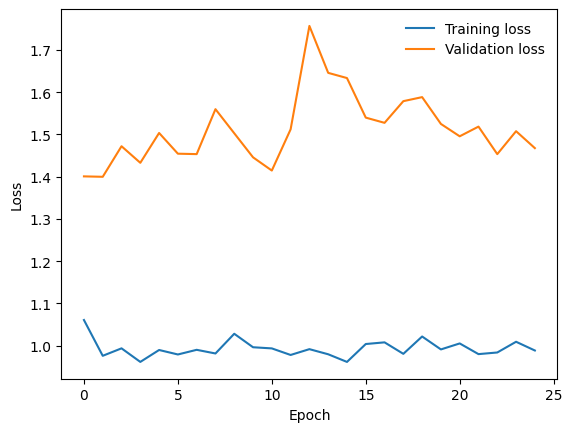

In [29]:
def plot_losses(train_losses, val_losses):
    plt.plot(train_losses, label="Training loss")
    plt.plot(val_losses, label="Validation loss")
    plt.legend(frameon=False)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.show()


plot_losses(train_losses, val_losses)

### Evaluation on Test Set

In [30]:
def evaluate_model(model, dataloader, criterion):
    model.eval()
    running_loss = 0.0
    running_corrects = 0
    running_mod_score = 0.0

    for i, (inputs, labels) in enumerate(dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # calculate modernity score
            probs = torch.nn.functional.softmax(outputs, dim=1)
            mod_scores = torch.sum(
                probs * torch.tensor([0.0, 1.0, 2.0, 3.0, 4.0]).to(device), dim=1
            )
            running_mod_score += torch.sum(mod_scores).item()

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    total_loss = running_loss / len(dataloader.dataset)
    total_acc = running_corrects.double() / len(dataloader.dataset)
    total_mod_score = running_mod_score / len(dataloader.dataset)

    print(f"Test Loss: {total_loss:.4f}")
    print(f"Test Accuracy: {total_acc:.4f}")
    print(f"Test Modernity Score: {total_mod_score:.4f}")


# use the function to evaluate the model
evaluate_model(model, test_loader, criterion)

Test Loss: 1.7789
Test Accuracy: 0.2308
Test Modernity Score: 1.9634


### Option B: Fine tuning ResNet-18 model

In [44]:
# Load a pretrained ResNet-18 model
model_ft = models.resnet18(weights="IMAGENET1K_V1")

# Add a new last layer to match the number of classes in your dataset
num_ftrs = model_ft.fc.in_features
model_ft.fc = torch.nn.Linear(num_ftrs, num_classes)

model_ft = model_ft.to(device)

criterion = torch.nn.CrossEntropyLoss()

optimizer_ft = torch.optim.Adam(model_ft.parameters(), lr=0.001)

exp_lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [45]:
num_epochs = 25
model_ft, train_losses_1, val_losses_1 = train_model(
    model_ft, criterion, optimizer_ft, exp_lr_scheduler, num_epochs
)

Epoch 0/24
----------


train Loss: 43.0193 Acc: 0.7696 Mod Score: 3.3220: 100%|██████████| 695/695 [00:49<00:00, 13.93it/s]


train Loss: 0.6722 Acc: 0.7336 Mod Score: 3.1665



val Loss: 89.7305 Acc: 0.6650 Mod Score: 3.5140: 100%|██████████| 91/91 [00:06<00:00, 14.32it/s] 


val Loss: 1.4045 Acc: 0.5621 Mod Score: 2.9701

Epoch 1/24
----------



/home/sbhor/anaconda3/envs/smpl/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:152: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
train Loss: 27.5139 Acc: 0.8817 Mod Score: 3.3256: 100%|██████████| 695/695 [00:50<00:00, 13.77it/s]


train Loss: 0.4299 Acc: 0.8404 Mod Score: 3.1700



val Loss: 98.8124 Acc: 0.5702 Mod Score: 3.5459: 100%|██████████| 91/91 [00:06<00:00, 14.23it/s] 


val Loss: 1.5466 Acc: 0.4819 Mod Score: 2.9970

Epoch 2/24
----------



train Loss: 22.1266 Acc: 0.9149 Mod Score: 3.3251: 100%|██████████| 695/695 [00:50<00:00, 13.69it/s]



train Loss: 0.3458 Acc: 0.8721 Mod Score: 3.1694


val Loss: 107.9789 Acc: 0.6435 Mod Score: 3.5450: 100%|██████████| 91/91 [00:06<00:00, 14.26it/s]


val Loss: 1.6901 Acc: 0.5439 Mod Score: 2.9962

Epoch 3/24
----------



train Loss: 19.5385 Acc: 0.9319 Mod Score: 3.3238: 100%|██████████| 695/695 [00:50<00:00, 13.68it/s]



train Loss: 0.3053 Acc: 0.8883 Mod Score: 3.1682


val Loss: 94.6806 Acc: 0.6838 Mod Score: 3.6831: 100%|██████████| 91/91 [00:06<00:00, 14.41it/s]


val Loss: 1.4819 Acc: 0.5779 Mod Score: 3.1130

Epoch 4/24
----------



train Loss: 17.1312 Acc: 0.9455 Mod Score: 3.3244: 100%|██████████| 695/695 [00:50<00:00, 13.78it/s]


train Loss: 0.2677 Acc: 0.9013 Mod Score: 3.1688



val Loss: 124.7753 Acc: 0.5924 Mod Score: 3.2999: 100%|██████████| 91/91 [00:06<00:00, 14.32it/s]


val Loss: 1.9530 Acc: 0.5007 Mod Score: 2.7891

Epoch 5/24
----------



train Loss: 15.5442 Acc: 0.9562 Mod Score: 3.3246: 100%|██████████| 695/695 [00:50<00:00, 13.82it/s]


train Loss: 0.2429 Acc: 0.9114 Mod Score: 3.1690



val Loss: 113.5821 Acc: 0.6109 Mod Score: 3.6367: 100%|██████████| 91/91 [00:06<00:00, 14.18it/s]


val Loss: 1.7778 Acc: 0.5163 Mod Score: 3.0738

Epoch 6/24
----------



train Loss: 14.4076 Acc: 0.9624 Mod Score: 3.3247: 100%|██████████| 695/695 [00:48<00:00, 14.21it/s]


train Loss: 0.2251 Acc: 0.9174 Mod Score: 3.1690



val Loss: 123.3761 Acc: 0.7517 Mod Score: 3.6449: 100%|██████████| 91/91 [00:06<00:00, 14.49it/s]


val Loss: 1.9311 Acc: 0.6354 Mod Score: 3.0807

Epoch 7/24
----------



train Loss: 13.2009 Acc: 0.9703 Mod Score: 3.3245: 100%|██████████| 695/695 [00:51<00:00, 13.55it/s]


train Loss: 0.2063 Acc: 0.9249 Mod Score: 3.1689



val Loss: 123.5250 Acc: 0.6292 Mod Score: 3.3889: 100%|██████████| 91/91 [00:06<00:00, 14.31it/s]


val Loss: 1.9334 Acc: 0.5318 Mod Score: 2.8643

Epoch 8/24
----------



train Loss: 12.2131 Acc: 0.9751 Mod Score: 3.3244: 100%|██████████| 695/695 [00:51<00:00, 13.60it/s]


train Loss: 0.1908 Acc: 0.9294 Mod Score: 3.1688



val Loss: 139.4097 Acc: 0.6457 Mod Score: 3.5596: 100%|██████████| 91/91 [00:06<00:00, 14.30it/s]


val Loss: 2.1820 Acc: 0.5458 Mod Score: 3.0085

Epoch 9/24
----------



train Loss: 11.3689 Acc: 0.9812 Mod Score: 3.3246: 100%|██████████| 695/695 [00:51<00:00, 13.62it/s]


train Loss: 0.1777 Acc: 0.9353 Mod Score: 3.1690



val Loss: 141.7331 Acc: 0.6083 Mod Score: 3.5026: 100%|██████████| 91/91 [00:06<00:00, 14.43it/s]


val Loss: 2.2184 Acc: 0.5141 Mod Score: 2.9604

Epoch 10/24
----------



train Loss: 10.8580 Acc: 0.9843 Mod Score: 3.3250: 100%|██████████| 695/695 [00:50<00:00, 13.68it/s]



train Loss: 0.1697 Acc: 0.9382 Mod Score: 3.1694


val Loss: 155.2376 Acc: 0.5114 Mod Score: 3.4170: 100%|██████████| 91/91 [00:06<00:00, 14.29it/s]


val Loss: 2.4298 Acc: 0.4322 Mod Score: 2.8881

Epoch 11/24
----------



train Loss: 10.1719 Acc: 0.9888 Mod Score: 3.3242: 100%|██████████| 695/695 [00:51<00:00, 13.59it/s]



train Loss: 0.1589 Acc: 0.9425 Mod Score: 3.1686


val Loss: 144.4107 Acc: 0.5708 Mod Score: 3.4417: 100%|██████████| 91/91 [00:06<00:00, 14.34it/s]


val Loss: 2.2603 Acc: 0.4825 Mod Score: 2.9089

Epoch 12/24
----------



train Loss: 9.3859 Acc: 0.9941 Mod Score: 3.3250: 100%|██████████| 695/695 [00:50<00:00, 13.64it/s] 


train Loss: 0.1467 Acc: 0.9476 Mod Score: 3.1694



val Loss: 171.7748 Acc: 0.6321 Mod Score: 3.5241: 100%|██████████| 91/91 [00:06<00:00, 14.27it/s]


val Loss: 2.6886 Acc: 0.5342 Mod Score: 2.9786

Epoch 13/24
----------



train Loss: 9.4986 Acc: 0.9932 Mod Score: 3.3248: 100%|██████████| 695/695 [00:50<00:00, 13.82it/s] 


train Loss: 0.1484 Acc: 0.9467 Mod Score: 3.1692



val Loss: 161.8108 Acc: 0.6935 Mod Score: 3.5580: 100%|██████████| 91/91 [00:06<00:00, 14.58it/s]


val Loss: 2.5326 Acc: 0.5862 Mod Score: 3.0072

Epoch 14/24
----------



train Loss: 8.7488 Acc: 0.9983 Mod Score: 3.3246: 100%|██████████| 695/695 [00:50<00:00, 13.65it/s]


train Loss: 0.1367 Acc: 0.9516 Mod Score: 3.1690



val Loss: 154.7962 Acc: 0.5987 Mod Score: 3.4183: 100%|██████████| 91/91 [00:06<00:00, 14.41it/s]


val Loss: 2.4229 Acc: 0.5060 Mod Score: 2.8892

Epoch 15/24
----------



train Loss: 8.2037 Acc: 1.0005 Mod Score: 3.3246: 100%|██████████| 695/695 [00:50<00:00, 13.69it/s]


train Loss: 0.1282 Acc: 0.9537 Mod Score: 3.1690



val Loss: 166.7646 Acc: 0.6748 Mod Score: 3.7358: 100%|██████████| 91/91 [00:06<00:00, 14.39it/s]


val Loss: 2.6102 Acc: 0.5703 Mod Score: 3.1575

Epoch 16/24
----------



train Loss: 7.8925 Acc: 1.0035 Mod Score: 3.3251: 100%|██████████| 695/695 [00:51<00:00, 13.49it/s]


train Loss: 0.1233 Acc: 0.9565 Mod Score: 3.1695



val Loss: 166.9020 Acc: 0.5842 Mod Score: 3.3658: 100%|██████████| 91/91 [00:06<00:00, 14.33it/s]


val Loss: 2.6123 Acc: 0.4938 Mod Score: 2.8448

Epoch 17/24
----------



train Loss: 7.6656 Acc: 1.0042 Mod Score: 3.3248: 100%|██████████| 695/695 [00:50<00:00, 13.89it/s]


train Loss: 0.1198 Acc: 0.9571 Mod Score: 3.1691



val Loss: 186.8141 Acc: 0.6032 Mod Score: 3.6561: 100%|██████████| 91/91 [00:06<00:00, 14.09it/s]


val Loss: 2.9240 Acc: 0.5098 Mod Score: 3.0901

Epoch 18/24
----------



train Loss: 7.2698 Acc: 1.0067 Mod Score: 3.3248: 100%|██████████| 695/695 [00:51<00:00, 13.57it/s]


train Loss: 0.1136 Acc: 0.9595 Mod Score: 3.1692



val Loss: 154.7706 Acc: 0.6296 Mod Score: 3.6263: 100%|██████████| 91/91 [00:06<00:00, 14.07it/s]


val Loss: 2.4224 Acc: 0.5322 Mod Score: 3.0649

Epoch 19/24
----------



train Loss: 7.2580 Acc: 1.0063 Mod Score: 3.3249: 100%|██████████| 695/695 [00:51<00:00, 13.54it/s]


train Loss: 0.1134 Acc: 0.9591 Mod Score: 3.1693



val Loss: 219.5366 Acc: 0.5435 Mod Score: 3.6128: 100%|██████████| 91/91 [00:06<00:00, 14.16it/s]


val Loss: 3.4362 Acc: 0.4594 Mod Score: 3.0535

Epoch 20/24
----------



train Loss: 6.7864 Acc: 1.0092 Mod Score: 3.3245: 100%|██████████| 695/695 [00:49<00:00, 13.95it/s]


train Loss: 0.1060 Acc: 0.9620 Mod Score: 3.1689



val Loss: 157.3693 Acc: 0.5767 Mod Score: 3.6635: 100%|██████████| 91/91 [00:06<00:00, 14.29it/s]


val Loss: 2.4631 Acc: 0.4874 Mod Score: 3.0964

Epoch 21/24
----------



train Loss: 6.4343 Acc: 1.0119 Mod Score: 3.3251: 100%|██████████| 695/695 [00:49<00:00, 13.97it/s]



train Loss: 0.1005 Acc: 0.9645 Mod Score: 3.1695


val Loss: 150.0645 Acc: 0.6396 Mod Score: 3.6652: 100%|██████████| 91/91 [00:06<00:00, 14.34it/s]


val Loss: 2.3488 Acc: 0.5406 Mod Score: 3.0978

Epoch 22/24
----------



train Loss: 6.4895 Acc: 1.0119 Mod Score: 3.3250: 100%|██████████| 695/695 [00:49<00:00, 14.01it/s]


train Loss: 0.1014 Acc: 0.9645 Mod Score: 3.1693



val Loss: 183.4761 Acc: 0.6144 Mod Score: 3.6474: 100%|██████████| 91/91 [00:06<00:00, 14.17it/s]


val Loss: 2.8717 Acc: 0.5193 Mod Score: 3.0828

Epoch 23/24
----------



train Loss: 6.3125 Acc: 1.0127 Mod Score: 3.3245: 100%|██████████| 695/695 [00:49<00:00, 14.00it/s]


train Loss: 0.0986 Acc: 0.9653 Mod Score: 3.1689



val Loss: 156.3425 Acc: 0.6396 Mod Score: 3.6488: 100%|██████████| 91/91 [00:06<00:00, 14.21it/s]


val Loss: 2.4471 Acc: 0.5406 Mod Score: 3.0840

Epoch 24/24
----------



train Loss: 6.0154 Acc: 1.0132 Mod Score: 3.3252: 100%|██████████| 695/695 [00:49<00:00, 14.01it/s]


train Loss: 0.0940 Acc: 0.9657 Mod Score: 3.1695



val Loss: 152.5604 Acc: 0.6455 Mod Score: 3.6894: 100%|██████████| 91/91 [00:06<00:00, 14.67it/s]


val Loss: 2.3879 Acc: 0.5456 Mod Score: 3.1183

Best val Acc: 0.635363


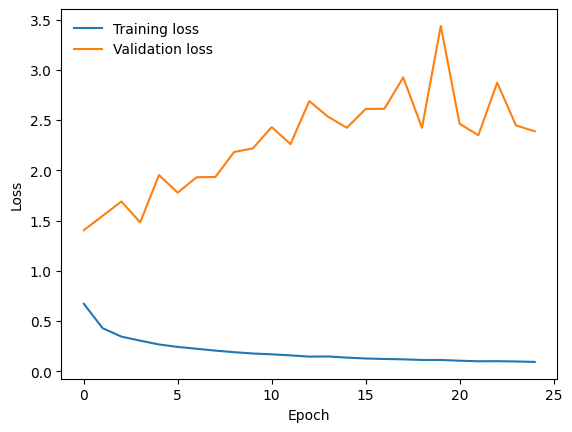

In [46]:
plot_losses(train_losses_1, val_losses_1)

In [47]:
evaluate_model(model_ft, test_loader, criterion)

Test Loss: 2.2354
Test Accuracy: 0.5054
Test Modernity Score: 3.1837


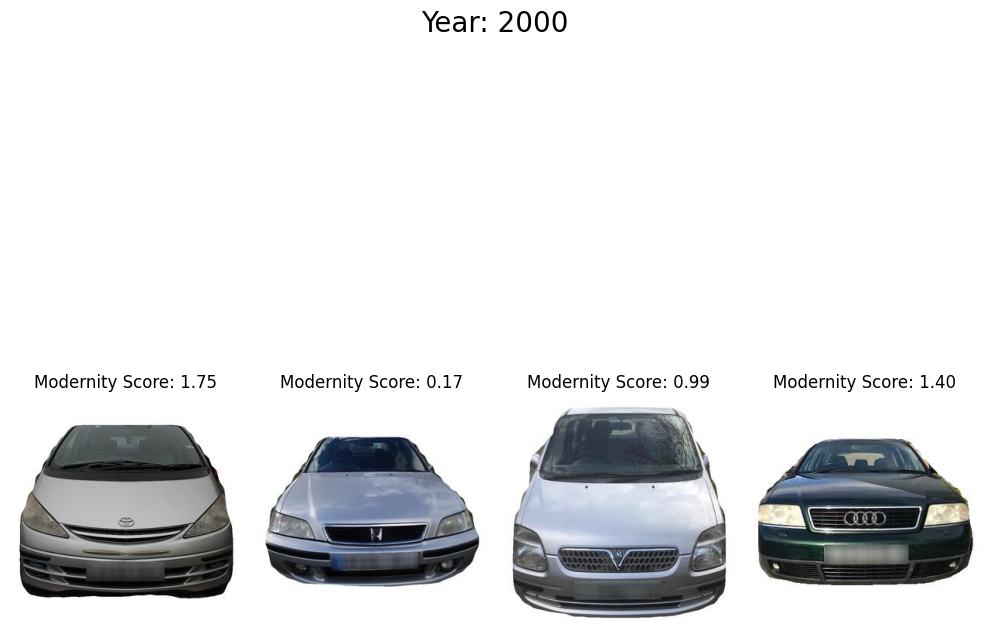

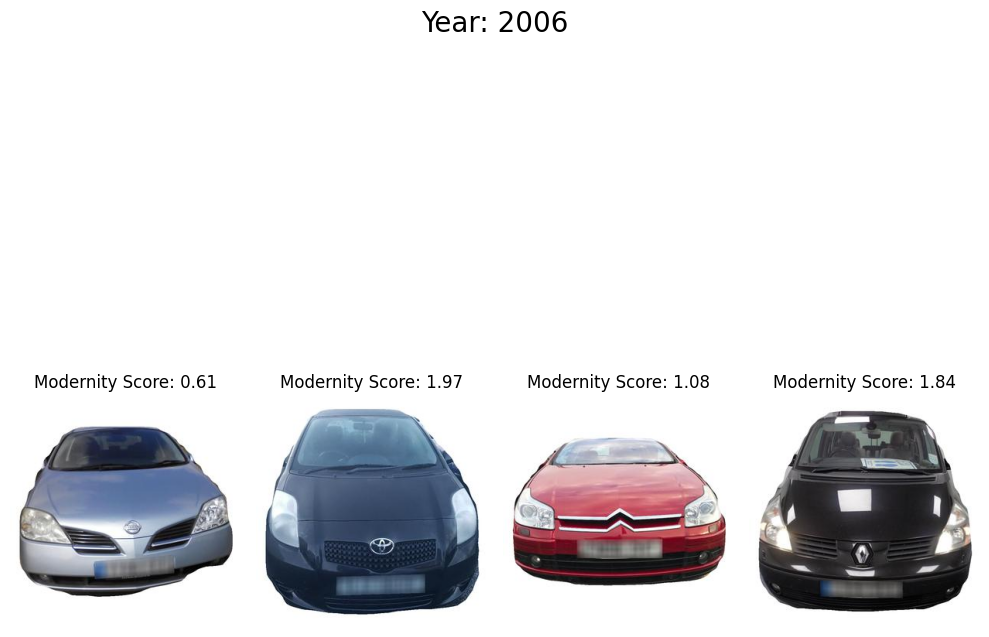

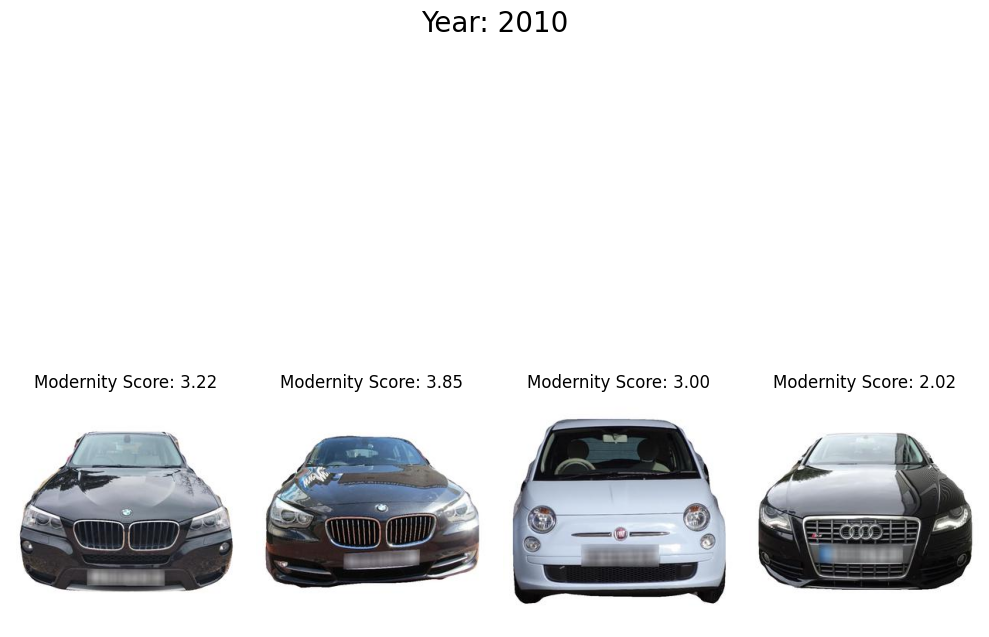

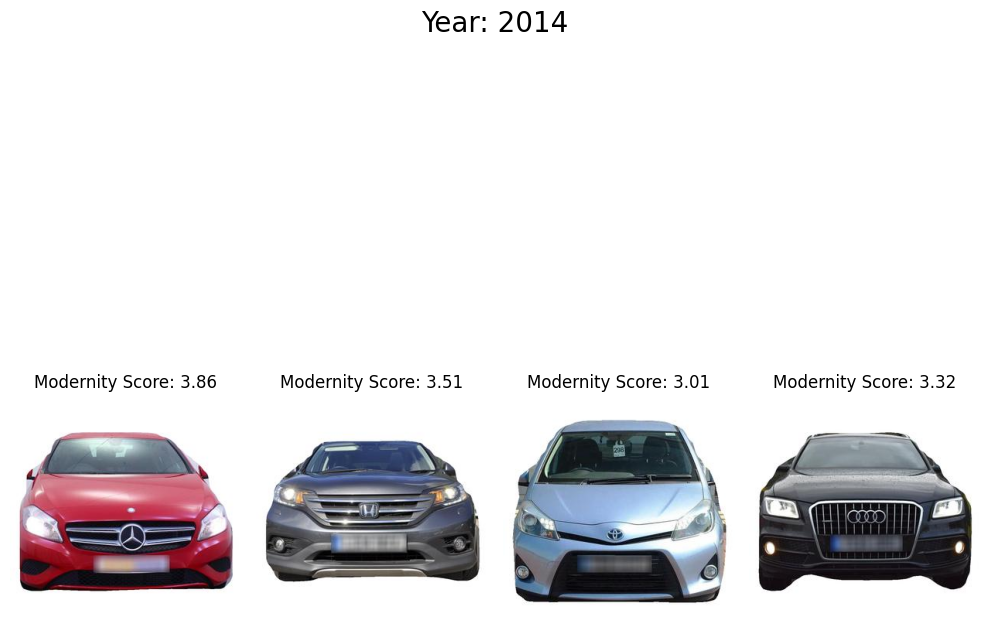

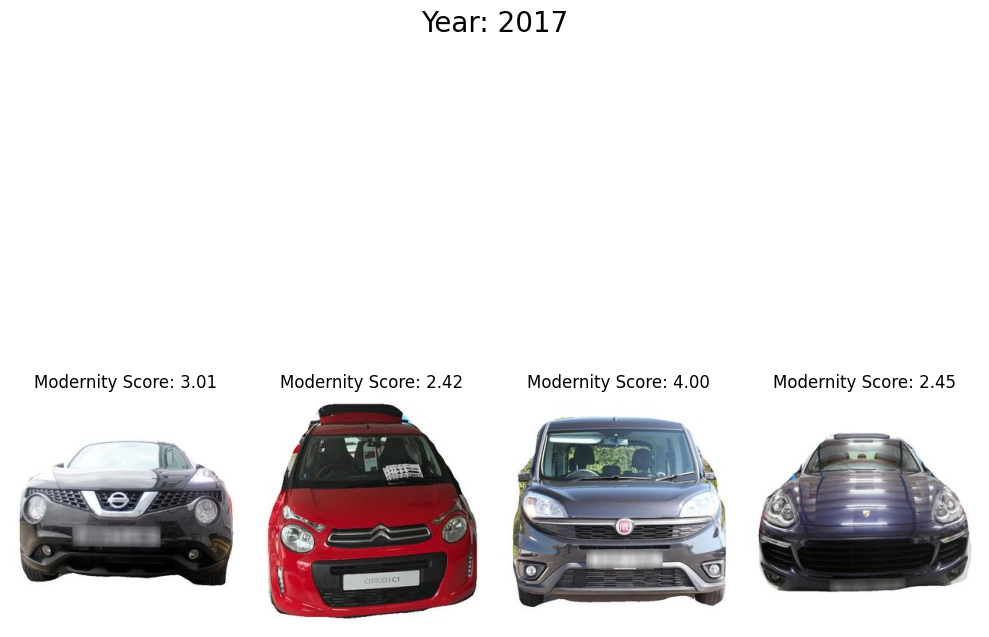

In [50]:
import matplotlib.pyplot as plt

years = [2000, 2006, 2010, 2014, 2017]
num_images_per_year = 4


def get_modernity_score(image, model):
    model.eval()
    image = image.to(device).unsqueeze(0)
    output = model(image)
    probs = torch.nn.functional.softmax(output, dim=1)
    mod_scores = torch.sum(
        probs * torch.tensor([0.0, 1.0, 2.0, 3.0, 4.0]).to(device), dim=1
    )
    return mod_scores.item()


for year in years:
    year_df = test_df[test_df["year"] == year]

    selected_images = year_df.sample(num_images_per_year)

    fig, axs = plt.subplots(1, num_images_per_year, figsize=(10, 10))
    fig.suptitle(f"Year: {year}", fontsize=20)

    for i, (_, row) in enumerate(selected_images.iterrows()):
        image = Image.open(row["image_path_x"]).convert("RGB")

        image_transformed = valid_test_transforms(image)

        mod_score = get_modernity_score(image_transformed, model_ft)
        axs[i].imshow(image)
        axs[i].set_title(f"Modernity Score: {mod_score:.2f}")
        axs[i].axis("off")

    plt.tight_layout()
    plt.show()

## Part 2: Automotive Design Typicality

In [12]:
# Load the new csv file
backup_df = df.copy()
body_type_df = pd.read_csv("autos.csv")

df["model_id"] = df["model_id"].astype(str)
df["year"] = df["year"].astype(int)

body_type_df["model_id"] = body_type_df["model_id"].astype(str)
body_type_df["model_year"] = body_type_df["model_year"].astype(int)

# Merge the two dataframes
df = pd.merge(
    df,
    body_type_df,
    how="left",
    left_on=["model_id", "year"],
    right_on=["model_id", "model_year"],
)

print(df.head())

                                          image_path   brand         model  \
0  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki  Grand Vitara   
1  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki         Ignis   
2  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki         Ignis   
3  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki  Grand Vitara   
4  ./Confirmed_fronts/confirmed_fronts/Suzuki/200...  Suzuki          Alto   

   year   color model_id advertiser_id     image_id  model_year   bodytype  
0  2003  Silver     87_4           219  image_4.jpg        2003        SUV  
1  2003    Blue     87_5             8  image_1.jpg        2003  Hatchback  
2  2003    Blue     87_5            12  image_0.jpg        2003  Hatchback  
3  2003   Black     87_4           257  image_0.jpg        2003        SUV  
4  2003  Silver     87_1           112  image_0.jpg        2003  Hatchback  


In [15]:
relevant_categories = ["Hatchback", "SUV", "MPV", "Saloon", "Convertible"]

# Filter the DataFrame to include only the relevant categories
df = df[df["bodytype"].isin(relevant_categories)]


model_ft = models.resnet18(pretrained=True)

# Replace the last fully connected layer with a new one
num_ftrs = model_ft.fc.in_features
model_ft.fc = torch.nn.Linear(num_ftrs, len(relevant_categories))

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model_ft = model_ft.to(device)

criterion = torch.nn.CrossEntropyLoss()

optimizer_ft = torch.optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

exp_lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

# Train and evaluate
model_ft, train_losses_2, val_losses_2 = train_model(
    model_ft, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=25
)

Epoch 0/24
----------


train Loss: 43.7712 Acc: 0.7751 \Mod Score: 3.3191: 100%|██████████| 695/695 [00:52<00:00, 13.35it/s]


train Loss: 0.6840 Acc: 0.7388 Mod Score: 3.1637



val Loss: 70.0887 Acc: 0.6060 \Mod Score: 3.5395: 100%|██████████| 91/91 [00:07<00:00, 12.81it/s]


val Loss: 1.0970 Acc: 0.5122 Mod Score: 2.9916

Epoch 1/24
----------



/home/sbhor/anaconda3/envs/smpl/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:152: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
train Loss: 22.6418 Acc: 0.9174 \Mod Score: 3.3240: 100%|██████████| 695/695 [00:54<00:00, 12.66it/s]


train Loss: 0.3538 Acc: 0.8745 Mod Score: 3.1684



val Loss: 73.8391 Acc: 0.7051 \Mod Score: 3.5116: 100%|██████████| 91/91 [00:06<00:00, 13.91it/s]


val Loss: 1.1557 Acc: 0.5960 Mod Score: 2.9680

Epoch 2/24
----------



train Loss: 16.7085 Acc: 0.9505 \Mod Score: 3.3244: 100%|██████████| 695/695 [00:54<00:00, 12.81it/s]


train Loss: 0.2611 Acc: 0.9060 Mod Score: 3.1688



val Loss: 82.2563 Acc: 0.6750 \Mod Score: 3.7205: 100%|██████████| 91/91 [00:06<00:00, 14.34it/s]


val Loss: 1.2875 Acc: 0.5705 Mod Score: 3.1446

Epoch 3/24
----------



train Loss: 13.5144 Acc: 0.9706 \Mod Score: 3.3240: 100%|██████████| 695/695 [00:53<00:00, 13.04it/s]


train Loss: 0.2112 Acc: 0.9252 Mod Score: 3.1684



val Loss: 88.9663 Acc: 0.6115 \Mod Score: 3.6718: 100%|██████████| 91/91 [00:07<00:00, 12.47it/s]


val Loss: 1.3925 Acc: 0.5169 Mod Score: 3.1034

Epoch 4/24
----------



train Loss: 11.3883 Acc: 0.9832 \Mod Score: 3.3252: 100%|██████████| 695/695 [00:54<00:00, 12.82it/s]


train Loss: 0.1780 Acc: 0.9372 Mod Score: 3.1696



val Loss: 83.2926 Acc: 0.7855 \Mod Score: 3.7640: 100%|██████████| 91/91 [00:06<00:00, 14.28it/s]


val Loss: 1.3037 Acc: 0.6639 Mod Score: 3.1814

Epoch 5/24
----------



train Loss: 9.8832 Acc: 0.9918 \Mod Score: 3.3239: 100%|██████████| 695/695 [00:55<00:00, 12.60it/s] 


train Loss: 0.1544 Acc: 0.9453 Mod Score: 3.1683



val Loss: 100.0454 Acc: 0.6956 \Mod Score: 3.5699: 100%|██████████| 91/91 [00:06<00:00, 13.33it/s]


val Loss: 1.5659 Acc: 0.5879 Mod Score: 3.0173

Epoch 6/24
----------



train Loss: 8.5919 Acc: 0.9996 \Mod Score: 3.3252: 100%|██████████| 695/695 [00:54<00:00, 12.82it/s]


train Loss: 0.1343 Acc: 0.9529 Mod Score: 3.1696



val Loss: 101.6722 Acc: 0.6351 \Mod Score: 3.7120: 100%|██████████| 91/91 [00:06<00:00, 13.02it/s]


val Loss: 1.5914 Acc: 0.5368 Mod Score: 3.1374

Epoch 7/24
----------



train Loss: 8.2625 Acc: 1.0025 \Mod Score: 3.3240: 100%|██████████| 695/695 [00:54<00:00, 12.69it/s]


train Loss: 0.1291 Acc: 0.9555 Mod Score: 3.1684



val Loss: 104.6012 Acc: 0.6575 \Mod Score: 3.5913: 100%|██████████| 91/91 [00:06<00:00, 14.33it/s]


val Loss: 1.6372 Acc: 0.5557 Mod Score: 3.0354

Epoch 8/24
----------



train Loss: 7.3102 Acc: 1.0080 \Mod Score: 3.3240: 100%|██████████| 695/695 [00:53<00:00, 12.99it/s]


train Loss: 0.1142 Acc: 0.9608 Mod Score: 3.1684



val Loss: 97.0181 Acc: 0.6838 \Mod Score: 3.6712: 100%|██████████| 91/91 [00:06<00:00, 14.07it/s] 


val Loss: 1.5185 Acc: 0.5779 Mod Score: 3.1029

Epoch 9/24
----------



train Loss: 6.8425 Acc: 1.0100 \Mod Score: 3.3259: 100%|██████████| 695/695 [00:54<00:00, 12.68it/s]


train Loss: 0.1069 Acc: 0.9627 Mod Score: 3.1702



val Loss: 105.5990 Acc: 0.6634 \Mod Score: 3.6318: 100%|██████████| 91/91 [00:06<00:00, 14.36it/s]


val Loss: 1.6528 Acc: 0.5607 Mod Score: 3.0696

Epoch 10/24
----------



train Loss: 6.2929 Acc: 1.0138 \Mod Score: 3.3245: 100%|██████████| 695/695 [00:54<00:00, 12.77it/s]


train Loss: 0.0983 Acc: 0.9663 Mod Score: 3.1689



val Loss: 117.8553 Acc: 0.6026 \Mod Score: 3.6646: 100%|██████████| 91/91 [00:06<00:00, 13.13it/s]


val Loss: 1.8447 Acc: 0.5093 Mod Score: 3.0974

Epoch 11/24
----------



train Loss: 5.6618 Acc: 1.0176 \Mod Score: 3.3247: 100%|██████████| 695/695 [00:54<00:00, 12.83it/s]


train Loss: 0.0885 Acc: 0.9700 Mod Score: 3.1691



val Loss: 118.0770 Acc: 0.6801 \Mod Score: 3.7814: 100%|██████████| 91/91 [00:06<00:00, 14.44it/s]


val Loss: 1.8481 Acc: 0.5748 Mod Score: 3.1960

Epoch 12/24
----------



train Loss: 5.4181 Acc: 1.0191 \Mod Score: 3.3246: 100%|██████████| 695/695 [00:56<00:00, 12.29it/s]


train Loss: 0.0847 Acc: 0.9714 Mod Score: 3.1690



val Loss: 117.7822 Acc: 0.6795 \Mod Score: 3.7239: 100%|██████████| 91/91 [00:07<00:00, 12.15it/s]


val Loss: 1.8435 Acc: 0.5743 Mod Score: 3.1474

Epoch 13/24
----------



train Loss: 5.0987 Acc: 1.0209 \Mod Score: 3.3245: 100%|██████████| 695/695 [00:59<00:00, 11.69it/s]


train Loss: 0.0797 Acc: 0.9731 Mod Score: 3.1689



val Loss: 139.2761 Acc: 0.6858 \Mod Score: 3.7751: 100%|██████████| 91/91 [00:06<00:00, 13.04it/s]


val Loss: 2.1799 Acc: 0.5796 Mod Score: 3.1907

Epoch 14/24
----------



train Loss: 4.8539 Acc: 1.0224 \Mod Score: 3.3246: 100%|██████████| 695/695 [00:55<00:00, 12.49it/s]


train Loss: 0.0758 Acc: 0.9746 Mod Score: 3.1690



val Loss: 126.2836 Acc: 0.6775 \Mod Score: 3.6708: 100%|██████████| 91/91 [00:06<00:00, 13.37it/s]


val Loss: 1.9766 Acc: 0.5726 Mod Score: 3.1026

Epoch 15/24
----------



train Loss: 4.4157 Acc: 1.0249 \Mod Score: 3.3246: 100%|██████████| 695/695 [00:55<00:00, 12.61it/s]



train Loss: 0.0690 Acc: 0.9770 Mod Score: 3.1690


val Loss: 137.5479 Acc: 0.6319 \Mod Score: 3.5725: 100%|██████████| 91/91 [00:07<00:00, 12.90it/s]


val Loss: 2.1529 Acc: 0.5341 Mod Score: 3.0195

Epoch 16/24
----------



train Loss: 4.3196 Acc: 1.0243 \Mod Score: 3.3247: 100%|██████████| 695/695 [00:53<00:00, 12.94it/s]


train Loss: 0.0675 Acc: 0.9763 Mod Score: 3.1690



val Loss: 148.4268 Acc: 0.6862 \Mod Score: 3.6568: 100%|██████████| 91/91 [00:06<00:00, 14.48it/s]


val Loss: 2.3232 Acc: 0.5800 Mod Score: 3.0907

Epoch 17/24
----------



train Loss: 4.2138 Acc: 1.0257 \Mod Score: 3.3249: 100%|██████████| 695/695 [00:54<00:00, 12.73it/s]


train Loss: 0.0658 Acc: 0.9777 Mod Score: 3.1692



val Loss: 135.3540 Acc: 0.6186 \Mod Score: 3.5886: 100%|██████████| 91/91 [00:06<00:00, 13.79it/s]


val Loss: 2.1185 Acc: 0.5229 Mod Score: 3.0331

Epoch 18/24
----------



train Loss: 3.9297 Acc: 1.0276 \Mod Score: 3.3249: 100%|██████████| 695/695 [00:57<00:00, 12.01it/s]


train Loss: 0.0614 Acc: 0.9795 Mod Score: 3.1692



val Loss: 142.8034 Acc: 0.6693 \Mod Score: 3.7522: 100%|██████████| 91/91 [00:07<00:00, 12.41it/s]


val Loss: 2.2351 Acc: 0.5657 Mod Score: 3.1714

Epoch 19/24
----------



train Loss: 3.8568 Acc: 1.0279 \Mod Score: 3.3249: 100%|██████████| 695/695 [00:56<00:00, 12.21it/s]


train Loss: 0.0603 Acc: 0.9797 Mod Score: 3.1693



val Loss: 151.2710 Acc: 0.6384 \Mod Score: 3.5618: 100%|██████████| 91/91 [00:06<00:00, 13.85it/s]


val Loss: 2.3677 Acc: 0.5396 Mod Score: 3.0104

Epoch 20/24
----------



train Loss: 3.7412 Acc: 1.0292 \Mod Score: 3.3246: 100%|██████████| 695/695 [00:53<00:00, 12.94it/s]


train Loss: 0.0585 Acc: 0.9810 Mod Score: 3.1689



val Loss: 152.7297 Acc: 0.6231 \Mod Score: 3.5463: 100%|██████████| 91/91 [00:06<00:00, 13.02it/s]


val Loss: 2.3905 Acc: 0.5267 Mod Score: 2.9973

Epoch 21/24
----------



train Loss: 3.4289 Acc: 1.0304 \Mod Score: 3.3248: 100%|██████████| 695/695 [00:54<00:00, 12.86it/s]


train Loss: 0.0536 Acc: 0.9822 Mod Score: 3.1692



val Loss: 153.1255 Acc: 0.5918 \Mod Score: 3.6082: 100%|██████████| 91/91 [00:06<00:00, 14.27it/s]


val Loss: 2.3967 Acc: 0.5002 Mod Score: 3.0497

Epoch 22/24
----------



train Loss: 3.4198 Acc: 1.0306 \Mod Score: 3.3248: 100%|██████████| 695/695 [00:54<00:00, 12.71it/s]


train Loss: 0.0534 Acc: 0.9823 Mod Score: 3.1692



val Loss: 151.2000 Acc: 0.6443 \Mod Score: 3.5083: 100%|██████████| 91/91 [00:07<00:00, 12.96it/s]


val Loss: 2.3666 Acc: 0.5445 Mod Score: 2.9653

Epoch 23/24
----------



train Loss: 3.3948 Acc: 1.0305 \Mod Score: 3.3244: 100%|██████████| 695/695 [00:55<00:00, 12.52it/s]


train Loss: 0.0530 Acc: 0.9823 Mod Score: 3.1688



val Loss: 142.1326 Acc: 0.5971 \Mod Score: 3.5991: 100%|██████████| 91/91 [00:07<00:00, 12.86it/s]


val Loss: 2.2246 Acc: 0.5046 Mod Score: 3.0420

Epoch 24/24
----------



train Loss: 3.1500 Acc: 1.0318 \Mod Score: 3.3252: 100%|██████████| 695/695 [00:54<00:00, 12.75it/s]


train Loss: 0.0492 Acc: 0.9835 Mod Score: 3.1696



val Loss: 135.7163 Acc: 0.7186 \Mod Score: 3.7214: 100%|██████████| 91/91 [00:07<00:00, 12.38it/s]


val Loss: 2.1242 Acc: 0.6073 Mod Score: 3.1453

Best val Acc: 0.663915


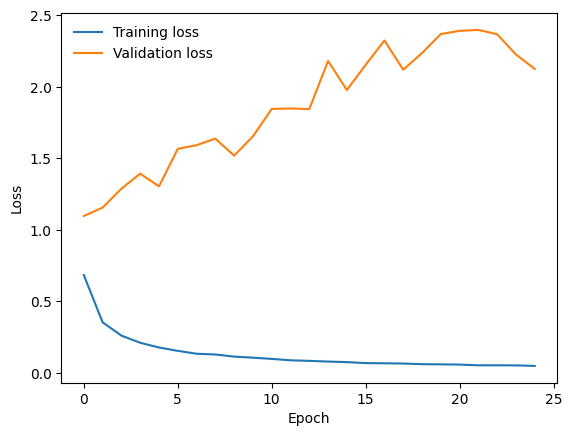

In [17]:
plot_losses(train_losses_2, val_losses_2)

### Define the hook function

In [20]:
activation = {}


def getActivation(name):
    # the hook signature
    def hook(model, input, output):
        activation[name] = output.detach()

    return hook

In [21]:
h1 = model_ft.avgpool.register_forward_hook(getActivation("avgpool"))

In [22]:
# Extract unique body types and model years
bodytypes = df["bodytype"].unique()
years = df["model_year"].unique()

# Create the mappings
bodytype_to_idx = {bodytype: idx for idx, bodytype in enumerate(bodytypes)}
year_to_idx = {year: idx for idx, year in enumerate(years)}

In [23]:
print(bodytype_to_idx)
print(year_to_idx)

{'SUV': 0, 'Hatchback': 1, 'Saloon': 2, 'MPV': 3, 'Convertible': 4}
{2003: 0, 2007: 1, 2015: 2, 2017: 3, 2013: 4, 2006: 5, 2009: 6, 2014: 7, 2011: 8, 2000: 9, 2016: 10, 2012: 11, 2010: 12, 2008: 13, 2018: 14}


In [24]:
class CarDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row["image_path"]).convert("RGB")
        if self.transform:
            image = self.transform(image)
        bodytype = torch.tensor(bodytype_to_idx[row["bodytype"]], dtype=torch.long)
        year = torch.tensor(year_to_category(row["year"]), dtype=torch.long)
        return image, bodytype, year


train_dataset = CarDataset(df, transform=train_transforms)

batch_size = 128
train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=False
)
print(df.shape)

(51641, 10)


In [25]:
group_features_sum = {}
group_count = {}
all_features = []
all_labels = []

# Get the avgpool features
for i, (images, bodytypes, years) in enumerate(train_loader):
    model_ft.eval()
    images = images.to(device)
    output = model_ft(images)
    bodytypes = bodytypes.tolist()
    years = years.tolist()
    features = activation["avgpool"].detach().cpu().numpy()

    # Add each feature to the corresponding group
    for feature, bodytype, year in zip(features, bodytypes, years):
        if (bodytype, year) not in group_features_sum:
            group_features_sum[(bodytype, year)] = np.zeros_like(feature)
            group_count[(bodytype, year)] = 0
        group_features_sum[(bodytype, year)] += feature
        group_count[(bodytype, year)] += 1

    all_features.append(features)  # Append features after processing
    all_labels.extend(zip(bodytypes, years))


# Concatenate all features
all_features = np.concatenate(all_features, axis=0)
all_labels = np.array(all_labels)

# Calculate the morph for each group by averaging the features
group_morphs = {k: group_features_sum[k] / group_count[k] for k in group_features_sum}
all_features = all_features.squeeze(-1).squeeze(-1)
h1.remove()

Explaination of the above cell:
1. `features = activation["avgpool"].detach().cpu().numpy()` gets the output of the "avgpool" layer of the model, detaches it from the computation graph (meaning that it won't be used for backpropagation in training), moves it to the CPU (in case it's on the GPU), and converts it from a PyTorch tensor to a numpy array.
2. Then, the code iterates through each feature (a feature is the output of the model for a particular image), body type, and year in the batch. It uses these to calculate the sum of the features for each group of body type and year. It also keeps a count of the number of images in each group.
3. The line `group_morphs = {k: group_features_sum[k] / group_count[k] for k in group_features_sum}` calculates the average feature (the "morph") for each group by dividing the sum of the features for that group by the count of the images in that group.

In [26]:
# Compute the cosine similarity between the morph of each group and the features of each image in that group
typicality_scores = []
print(all_features.shape)
print(all_labels.shape)

for bodytype, year in product(bodytype_to_idx.values(), year_to_idx.values()):
    group_idx = (all_labels == (bodytype, year)).all(axis=1)

    if group_idx.sum() > 0:  # Check if the group has any images
        group_features = all_features[group_idx]
        group_morph = group_morphs[(bodytype, year)]
        group_typicality_scores = cosine_similarity(
            group_features, group_morph.reshape(1, -1)
        )
        typicality_scores.append(group_typicality_scores)

typicality_scores = np.concatenate(typicality_scores, axis=0)
typicality_scores = torch.from_numpy(typicality_scores)
print(typicality_scores.shape)

(51641, 512)
(51641, 2)
torch.Size([51641, 1])


1. We iterate over all possible pairs of body type and year (this is what `product(bodytype_to_idx.values(), year_to_idx.values())` does).
2. For each pair of body type and year, we create a boolean array `group_idx` where each entry is True if the corresponding image in the dataset has that body type and year, and False otherwise. This is done with the line `group_idx = (all_labels == (bodytype, year)).all(axis=1)`.
3. we use `group_idx` to index into `all_features` and get the features for the images in the group. This is done with `group_features = all_features[group_idx]`.
4. We then retrieve the morph for the group with `group_morph = group_morphs[(bodytype, year)]`. 
5. We then calculate the typicality score for each image in the group by calculating the cosine similarity between the features for each image and the group morph. This is done with `group_typicality_scores = cosine_similarity(group_features, group_morph.reshape(1, -1))`. This gives a measure of how similar each image is to the average image for the group, with a score closer to 1 indicating a more typical image.

In [27]:
max_typicality_indices = []
# Convert all_labels to a list of tuples
all_labels_tuples = [tuple(x) for x in all_labels]

# Get unique groups by converting the list to a set
unique_groups = set(all_labels_tuples)
for group in unique_groups:
    group_indices = np.where((all_labels == group).all(axis=1))
    group_typicality_scores = typicality_scores[group_indices]
    max_typicality_index = group_indices[0][np.argmax(group_typicality_scores)]
    max_typicality_indices.append(max_typicality_index)

In [28]:
mean = torch.tensor([0.485, 0.456, 0.406])
std = torch.tensor([0.229, 0.224, 0.225])


def denormalize(image, mean, std):
    image = image.clone()
    for t, m, s in zip(image, mean, std):
        t.mul_(s).add_(m)
    return image

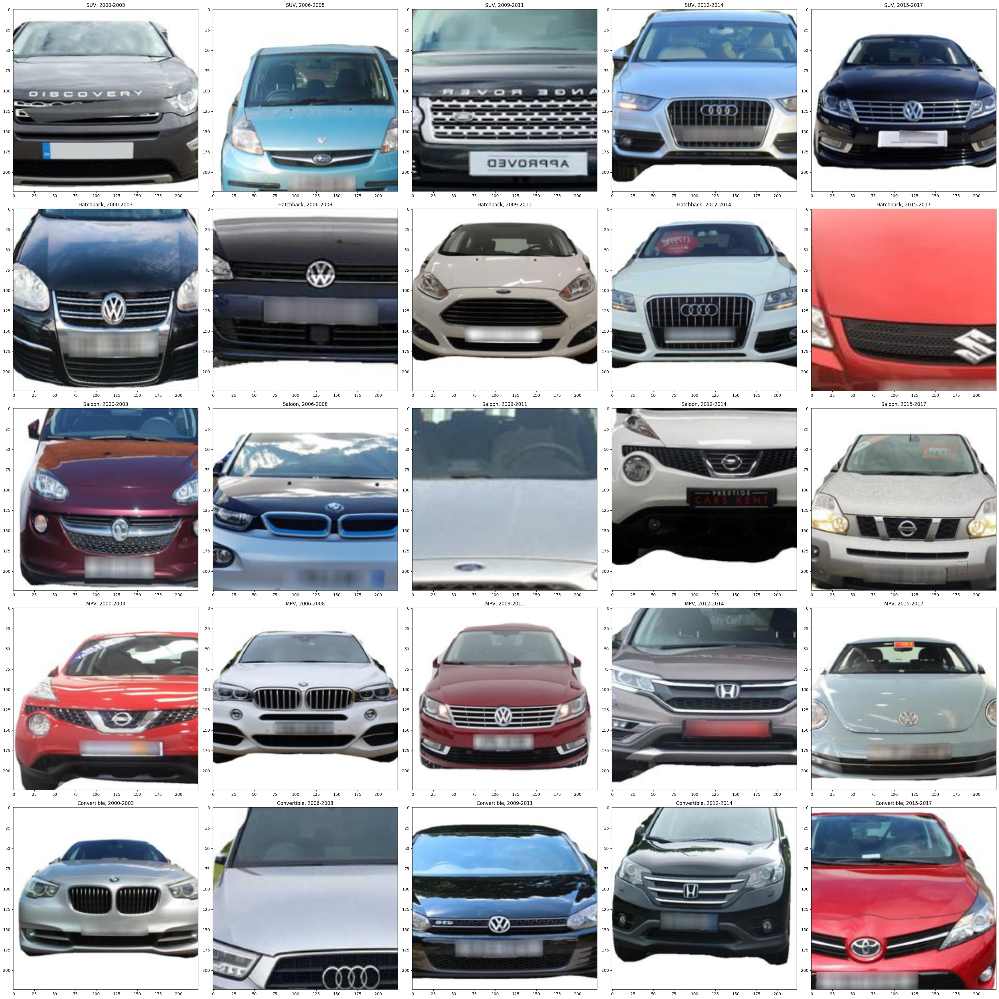

In [29]:
# Create reverse mappings
bodytype_to_id = {0: "SUV", 1: "Hatchback", 2: "Saloon", 3: "MPV", 4: "Convertible"}
modelyear_to_id = {
    0: "2000-2003",
    1: "2006-2008",
    2: "2009-2011",
    3: "2012-2014",
    4: "2015-2017",
}
unique_bodytypes = relevant_categories
unique_modelyears = ["2000-2003", "2006-2008", "2009-2011", "2012-2014", "2015-2017"]

# Prepare 2D indices
# 2D indices: The indices_2d dictionary is built, where the keys are tuples of (bodytype_id, modelyear_id)
# and the values are the corresponding indices in the all_labels array.
# Essentially, it maps each body type and model year combination to the index of an image that has this combination.
# Create a list of indices
indices = list(range(len(all_labels)))
import random

# Shuffle the indices
random.shuffle(indices)

# Rearrange your labels and dataset
all_labels = all_labels[indices]
train_dataset = [train_dataset[i] for i in indices]

# Now continue with your code as before
indices_2d = {
    (bodytype_id, modelyear_id): index
    for index, (bodytype_id, modelyear_id) in enumerate(all_labels)
}

fig, axs = plt.subplots(
    len(bodytype_to_id),
    len(modelyear_to_id),
    figsize=(7 * len(modelyear_to_id), 7 * len(bodytype_to_id)),
)

for bodytype_id, bodytype_name in bodytype_to_id.items():
    for modelyear_id, modelyear_name in modelyear_to_id.items():
        ax = axs[bodytype_id, modelyear_id]
        ax.grid(False)
        index = indices_2d.get((bodytype_id, modelyear_id))
        if index is not None:
            image_tensor, _, _ = train_dataset[index]
            image_tensor = denormalize(image_tensor, mean, std)
            ax.imshow(image_tensor.permute(1, 2, 0), aspect="auto")
        ax.title.set_text(f"{bodytype_name}, {modelyear_name}")


plt.tight_layout()
plt.show()

Along the rows you can see how the cars have evolved around the years. And the columns show different types of cars for that particular year.

I tried to visualize the entire image but some reason some of the images are not entirely visible.

In [30]:
# five groups as (body type, model year) pairs
chosen_groups = [(0, 0), (1, 1), (2, 2), (3, 3), (4, 4)]

group_indices = {
    group: sorted(
        (index for index, labels in enumerate(all_labels) if tuple(labels) == group),
        key=lambda index: typicality_scores[index],
    )
    for group in chosen_groups
}

In [31]:
def get_index_at_percentile(indices, scores, percentile):
    if len(indices) == 0:
        return None
    sorted_indices = sorted(indices, key=lambda index: scores[index])
    idx = int(len(sorted_indices) * percentile / 100)
    idx = min(idx, len(sorted_indices) - 1)
    return sorted_indices[idx]

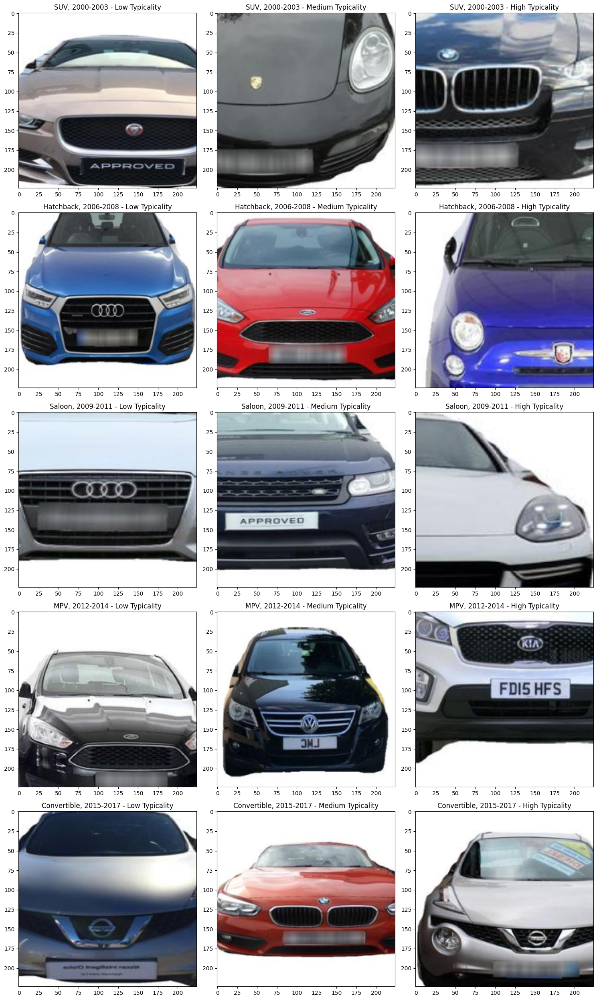

In [34]:
fig, axs = plt.subplots(len(chosen_groups), 3, figsize=(15, 5 * len(chosen_groups)))

for i, group in enumerate(chosen_groups):
    indices = group_indices[group]
    for j, percentile in enumerate(
        [0, 50, 100]
    ):  # 0th, 50th, and 100th percentile for low typicality, medium typicality, and high typicality respectively
        index = get_index_at_percentile(indices, typicality_scores, percentile)
        if index is not None:
            image_tensor, _, _ = train_dataset[index]
            image_tensor = denormalize(image_tensor, mean, std)
            axs[i, j].imshow(image_tensor.permute(1, 2, 0), aspect="auto")
            axs[i, j].grid(False)

            if j == 0:
                axs[i, j].title.set_text(
                    f"{bodytype_to_id[group[0]]}, {modelyear_to_id[group[1]]} - Low Typicality"
                )
            elif j == 1:
                axs[i, j].title.set_text(
                    f"{bodytype_to_id[group[0]]}, {modelyear_to_id[group[1]]} - Medium Typicality"
                )
            else:
                axs[i, j].title.set_text(
                    f"{bodytype_to_id[group[0]]}, {modelyear_to_id[group[1]]} - High Typicality"
                )

plt.tight_layout()
plt.show()

Typicality Analysis: From the calculation of typicality scores, we can make observations about which images of cars are the most "typical" for each body type and model year group. The higher the typicality score, the more representative the car image is for its group.
So on the  right hand side images we can see the highest typicality scores of the car given the year and the body type of the car.